# DEG error analysis

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import upath
from helpers import deg_analysis

In [3]:
import logging

format_str = "%(asctime)s - %(name)s - %(levelname)s - %(message)s"
logging.basicConfig(filename="plot_roc_curves.log", format=format_str)
# logging.getLogger("gcsfs").setLevel(logging.INFO)
# logging.getLogger("fsspec").setLevel(logging.INFO)
logging.getLogger("deg_analysis").setLevel("DEBUG")
logging.captureWarnings(True)

In [25]:
paths = [
    upath.UPath("gs://liulab/differential_composition_and_expression/20230317_06h00m45s"),
    upath.UPath("gs://liulab/differential_composition_and_expression/20230410_21h06m43s"),
    upath.UPath("gs://liulab/differential_composition_and_expression/20230505_21h41m44s"),
]

path_root = paths[-1]
# print(deg_analysis.get_parquet_paths(path_root))
# !gsutil ls "{path_root}/*"
print(path_root)

gs://liulab/differential_composition_and_expression/20230505_21h41m44s


In [ ]:
from helpers.deg_analysis.postprocessing_gene_stats_fields import get_parquet_paths


get_parquet_paths(path_root)

In [5]:
df_gene_stats = deg_analysis.load_gene_stats(path_root)

### checking pvals

False    16043
True        20
Name: significant_bh_fdr=0.10, dtype: int64


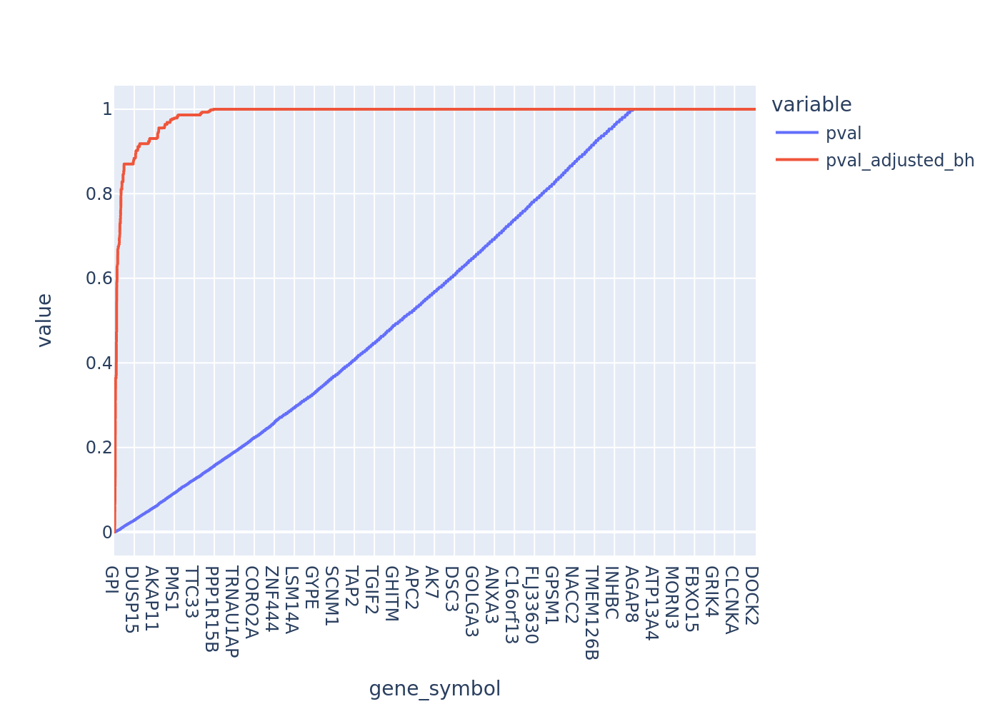

In [6]:
subset_gene_stats = df_gene_stats.loc["malignant_cibersortx", "0.72,0.7", "1.00", "04"]
# subset_gene_stats[columns].sort_values(by="-log10_pval_adjusted_bh", ascending=False)
print(subset_gene_stats["significant_bh_fdr=0.10"].value_counts())

columns = [
    "pval",
    # "-log10_pval",
    # "-log10_pval_signed_directional",
    "pval_adjusted_bh",
    # "-log10_pval_adjusted_bh",
    # "-log10_pval_adjusted_bh_signed_directional",
]
fig = px.line(
    subset_gene_stats.sort_values("pval").reset_index(),
    x="gene_symbol",
    y=columns,
)
fig.show(renderer="png", scale=2)

### volcanos for all experiment setups

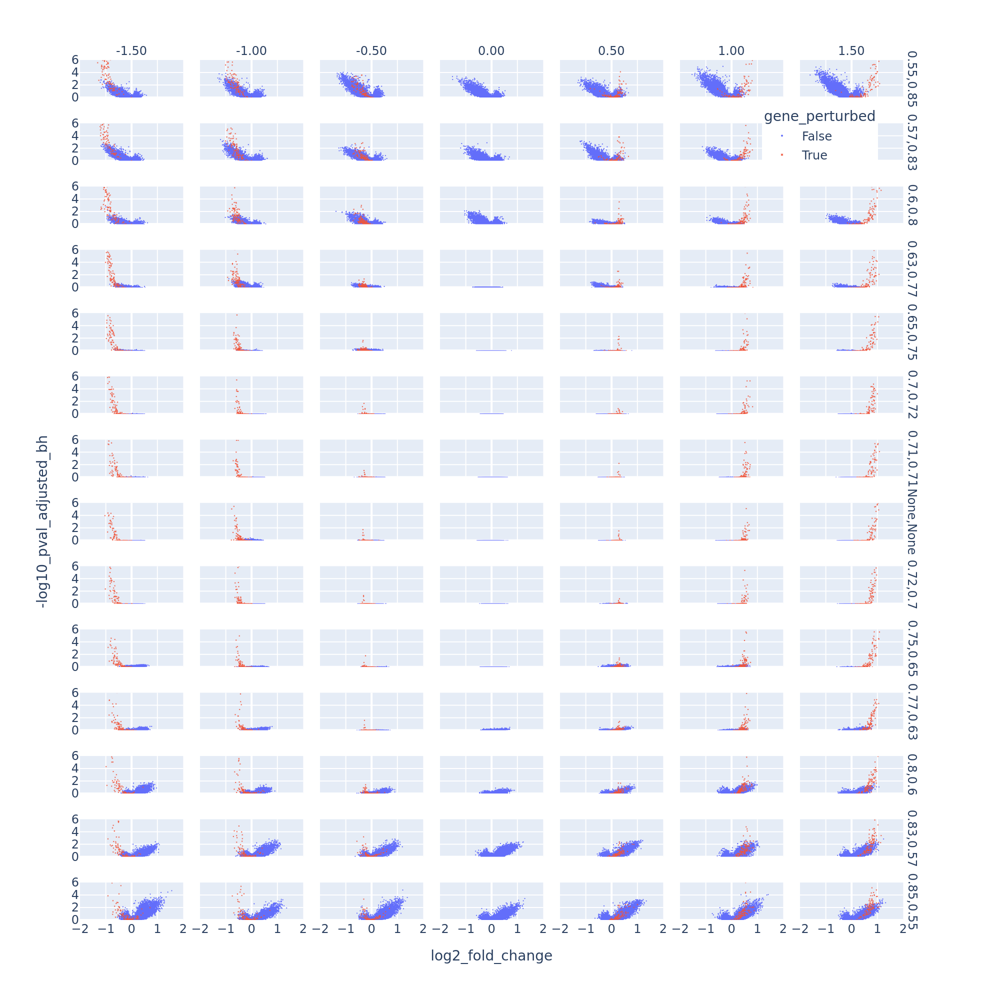

In [7]:
df_to_plot = df_gene_stats.xs("malignant_cibersortx", level="origin", drop_level=False)
fig = deg_analysis.make_volcano_grid_scatter(df_to_plot)
fig.show(renderer="png", scale=2)

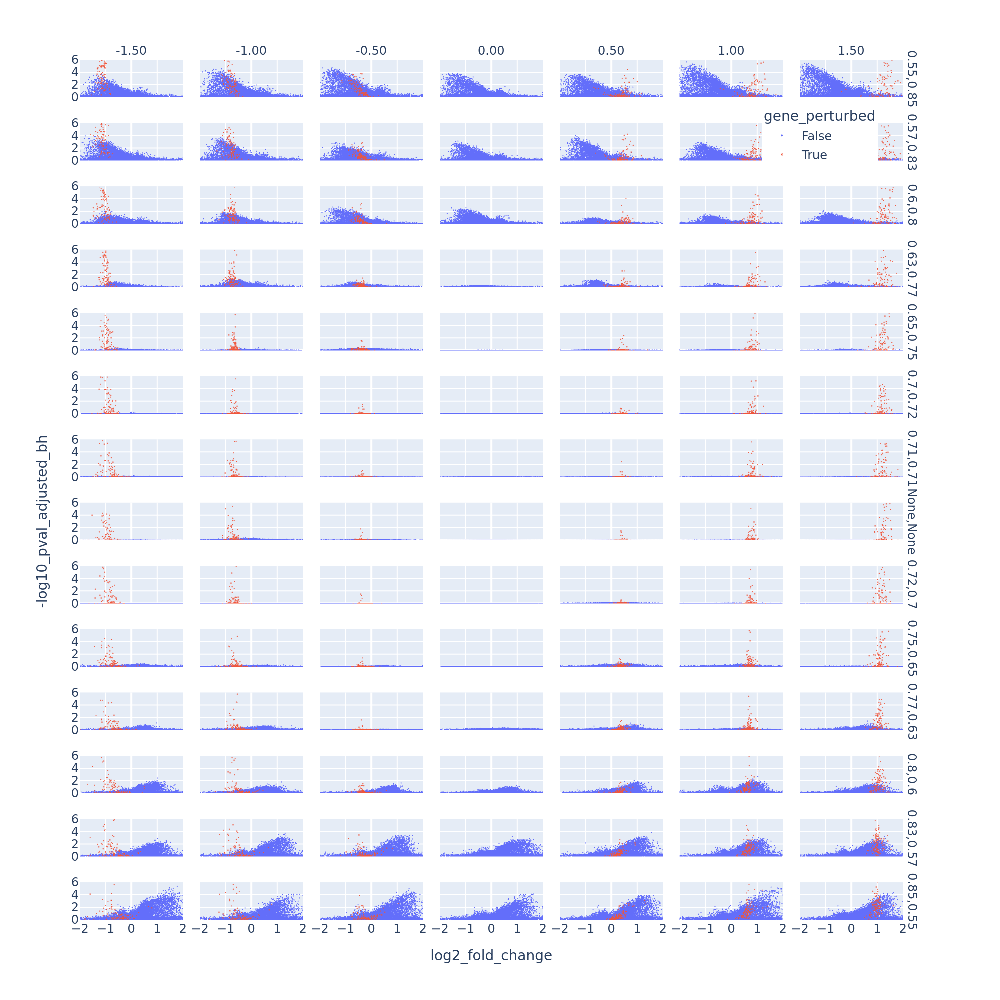

In [8]:
df_to_plot = df_gene_stats.xs("bulk", level="origin", drop_level=False)
fig = deg_analysis.make_volcano_grid_scatter(df_to_plot)
fig.show(renderer="png", scale=2)

## ROC, PPV, etc by p-value thresholds

In [9]:
# score_column = "-log10_pval_signed_directional"
score_column = "-log10_pval_adjusted_bh_signed_directional"

In [10]:
df = (
    df_gene_stats.loc[df_gene_stats.index.get_level_values("log2_fc") != "0.00"].xs(
        "malignant_cibersortx", level="origin", drop_level=False
    )
    #
)
df_roc_curves, df_roc_auc_scores = deg_analysis.calculate_roc(df, score_column)
df_precision_recall_curves, df_precision = deg_analysis.calculate_precision_and_recall(
    df, score_column
)

### ROC (TPR & FPR)

In [11]:
deg_analysis.make_table_scores(df_roc_auc_scores)

log2_fc,-1.50,-1.00,-0.50,0.50,1.00,1.50
malignant_means,,,,,,
"0.55,0.85",0.956173,0.921103,0.778675,0.726769,0.829032,0.892336
"0.57,0.83",0.960819,0.910320,0.793823,0.747049,0.844089,0.908165
"0.6,0.8",0.941031,0.929418,0.806101,0.743470,0.876803,0.910702
"0.63,0.77",0.925510,0.900062,0.817556,0.709154,0.815430,0.904147
"0.65,0.75",0.893642,0.862612,0.731981,0.669036,0.757511,0.860941
"0.7,0.72",0.853287,0.714775,0.624240,0.609557,0.729562,0.850464
"0.71,0.71",0.843305,0.741139,0.610472,0.580326,0.801771,0.845110
"None,None",0.814872,0.836669,0.660531,0.544039,0.737879,0.796415
"0.72,0.7",0.807160,0.731690,0.529011,0.677273,0.758487,0.825505


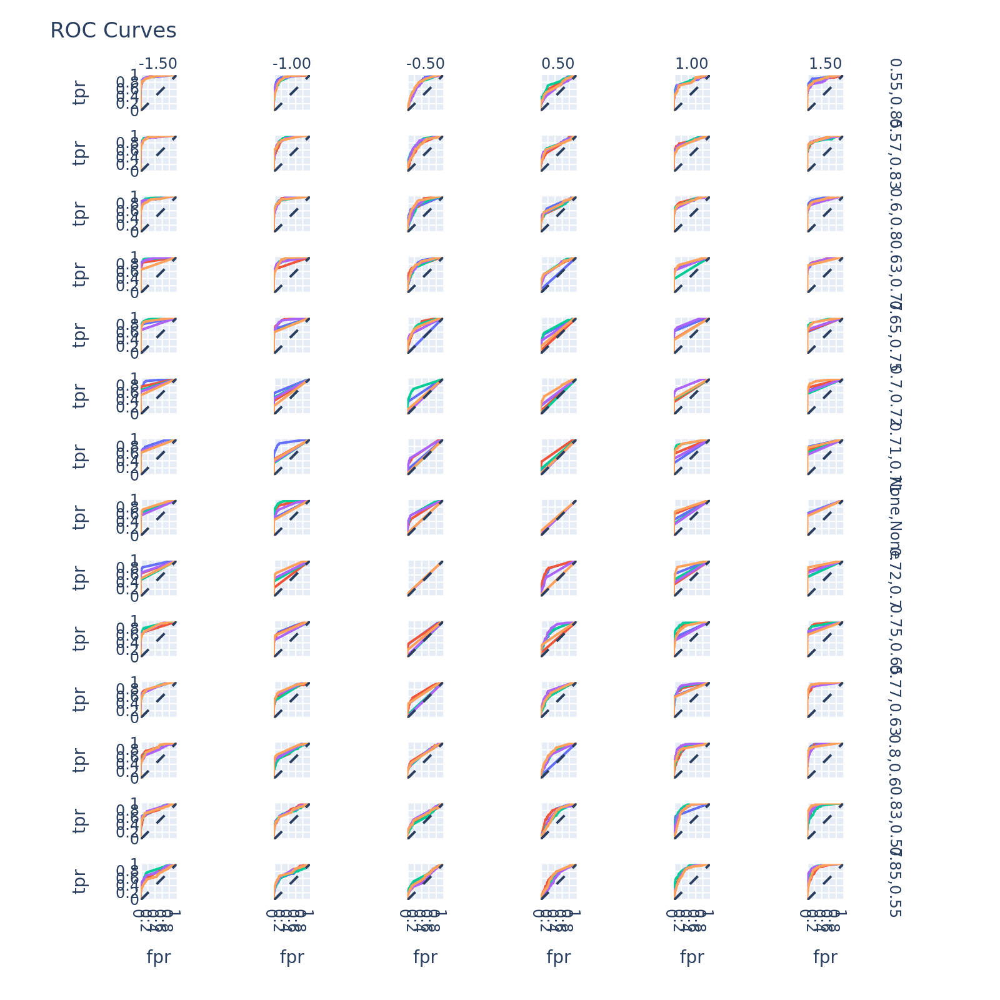

In [12]:
fig = deg_analysis.plot_roc(df_roc_curves)
fig.show(renderer="png", scale=2)

### PPV (precision)

In [13]:
deg_analysis.make_table_scores(df_precision)

log2_fc,-1.50,-1.00,-0.50,0.50,1.00,1.50
malignant_means,,,,,,
"0.55,0.85",0.143660,0.056292,0.017865,0.011698,0.014437,0.020625
"0.57,0.83",0.062297,0.176449,0.074910,0.133393,0.038479,0.290473
"0.6,0.8",0.389048,0.289046,0.286243,0.433553,0.262933,0.167904
"0.63,0.77",0.734812,0.453603,0.539024,0.435347,0.720284,0.603858
"0.65,0.75",0.812036,0.843393,0.383885,0.931429,0.905195,0.901569
"0.7,0.72",0.919928,0.984615,0.966667,0.511111,0.944383,0.945650
"0.71,0.71",0.926727,0.975942,0.600000,0.800000,0.951826,0.966784
"None,None",0.970044,0.799646,0.933333,1.000000,0.955747,0.967978
"0.72,0.7",0.953087,0.930683,0.800000,0.600000,0.954235,0.967491


In [14]:
deg_analysis.make_table_scores_with_stddev(df_precision)

log2_fc,-1.50,-1.00,-0.50,0.50,1.00,1.50
malignant_means,,,,,,
"0.55,0.85",0.14±0.20,0.06±0.05,0.02±0.00,0.01±0.00,0.01±0.01,0.02±0.01
"0.57,0.83",0.06±0.03,0.18±0.30,0.07±0.10,0.13±0.26,0.04±0.02,0.29±0.33
"0.6,0.8",0.39±0.35,0.29±0.32,0.29±0.43,0.43±0.40,0.26±0.17,0.17±0.18
"0.63,0.77",0.73±0.27,0.45±0.47,0.54±0.44,0.44±0.44,0.72±0.37,0.60±0.35
"0.65,0.75",0.81±0.16,0.84±0.20,0.38±0.46,0.93±0.10,0.91±0.19,0.90±0.13
"0.7,0.72",0.92±0.12,0.98±0.03,0.97±0.07,0.51±0.50,0.94±0.04,0.95±0.09
"0.71,0.71",0.93±0.12,0.98±0.04,0.60±0.55,0.80±0.45,0.95±0.04,0.97±0.03
"None,None",0.97±0.03,0.80±0.26,0.93±0.15,1.00±0.00,0.96±0.06,0.97±0.05
"0.72,0.7",0.95±0.04,0.93±0.08,0.80±0.45,0.60±0.55,0.95±0.05,0.97±0.04


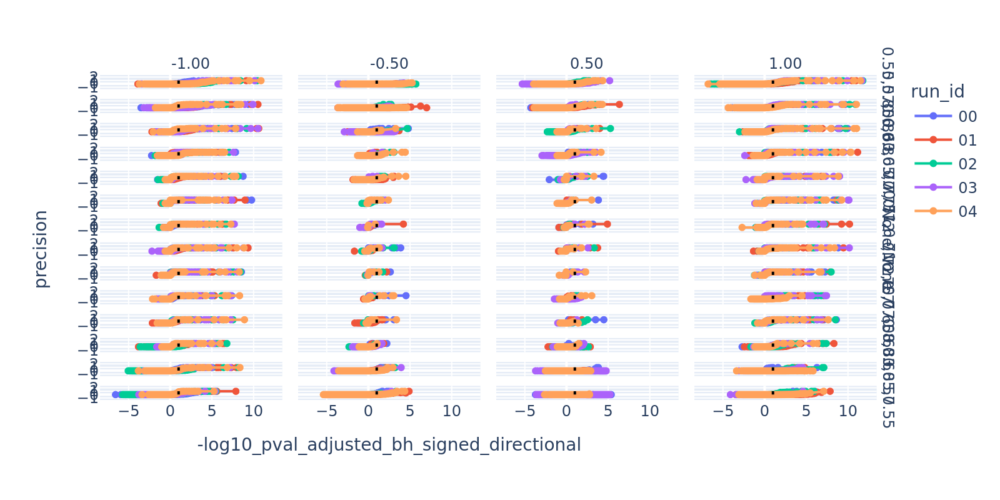

In [15]:
df_to_plot = (
    df_precision_recall_curves
    # .xs("None,None", level="malignant_means", drop_level=False)
    # .xs("1.50", level="log2_fc", drop_level=False)
    .loc[:, :, "-1.00":"1.00", :]
)
fig = deg_analysis.plot_metric_by_threshold(df_to_plot, score_column, "precision")
fig.update_layout(width=800, height=400)
fig.show(renderer="png", scale=2)
# fig

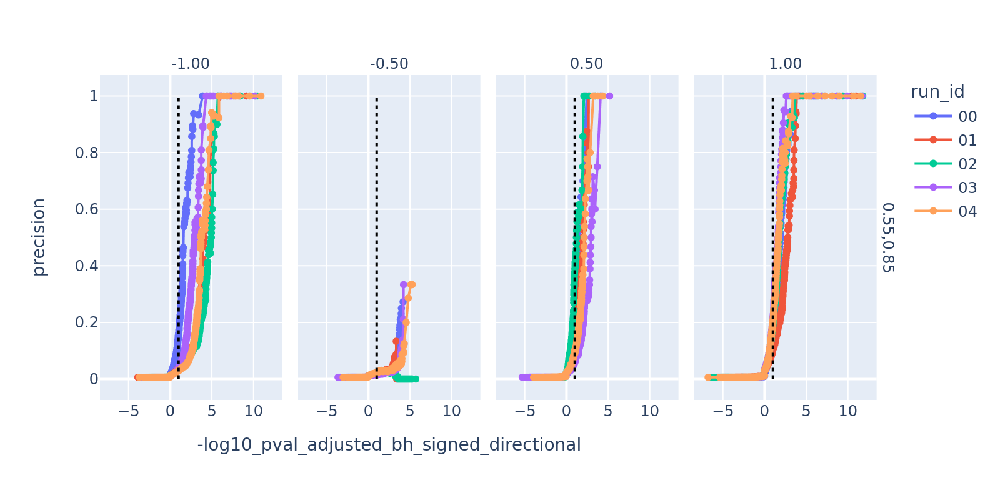

In [16]:
df_to_plot = df_precision_recall_curves.xs(
    "0.55,0.85", level="malignant_means", drop_level=False
).loc[:, :, "-1.00":"1.00", :]
fig = deg_analysis.plot_metric_by_threshold(df_to_plot, score_column, "precision")
fig.update_layout(width=800, height=400)
fig.show(renderer="png", scale=2)

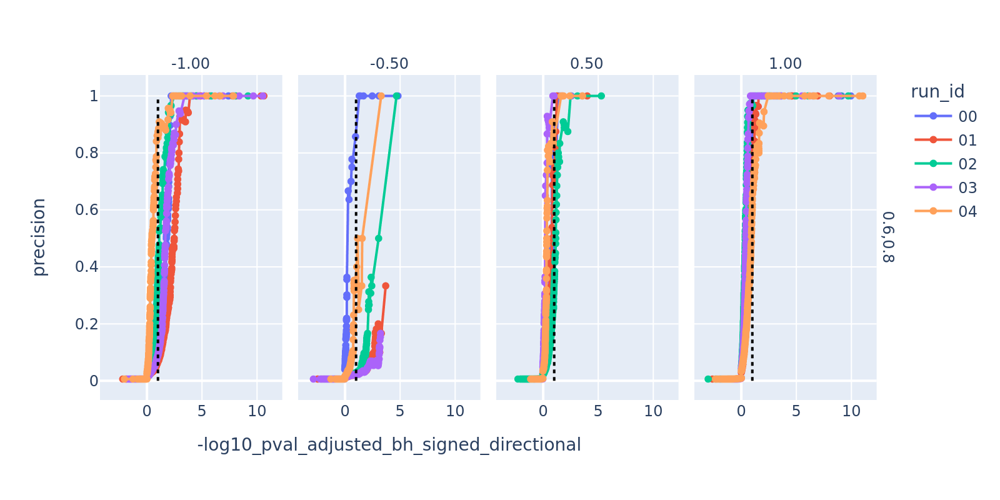

In [17]:
df_to_plot = df_precision_recall_curves.xs(
    "0.6,0.8", level="malignant_means", drop_level=False
).loc[:, :, "-1.00":"1.00", :]
fig = deg_analysis.plot_metric_by_threshold(df_to_plot, score_column, "precision")
fig.update_layout(width=800, height=400)
fig.show(renderer="png", scale=2)

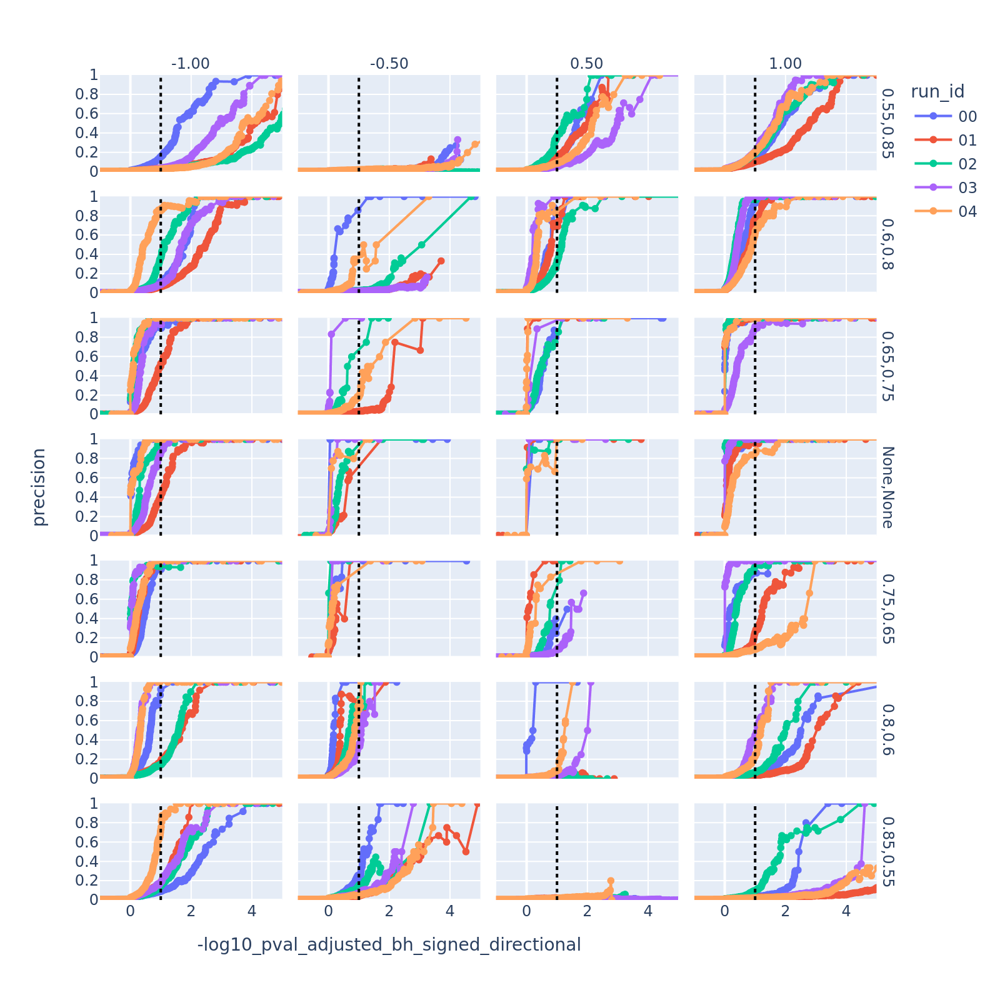

In [18]:
def filter_stuff(df):
    df = df.loc[
        df.index.get_level_values("malignant_means").isin(
            # ["0.55,0.85", "0.65,0.75", "None,None", "0.75,0.65", "0.85,0.55"]
            ["0.55,0.85", "0.6,0.8", "0.65,0.75", "None,None", "0.75,0.65", "0.8,0.6", "0.85,0.55"]
        )
    ]
    df = df.loc[:, :, "-1.00":"1.00"]
    return df


fig = deg_analysis.plot_metric_by_threshold(
    filter_stuff(df_precision_recall_curves),
    score_column,
    "precision",
)
fig.update_layout(width=800, height=800)
fig.update_xaxes(range=[-1, 5])
fig.update_yaxes(range=[0, 1], dtick=0.2)
fig.show(renderer="png", scale=2)

### Precision & Recall curves

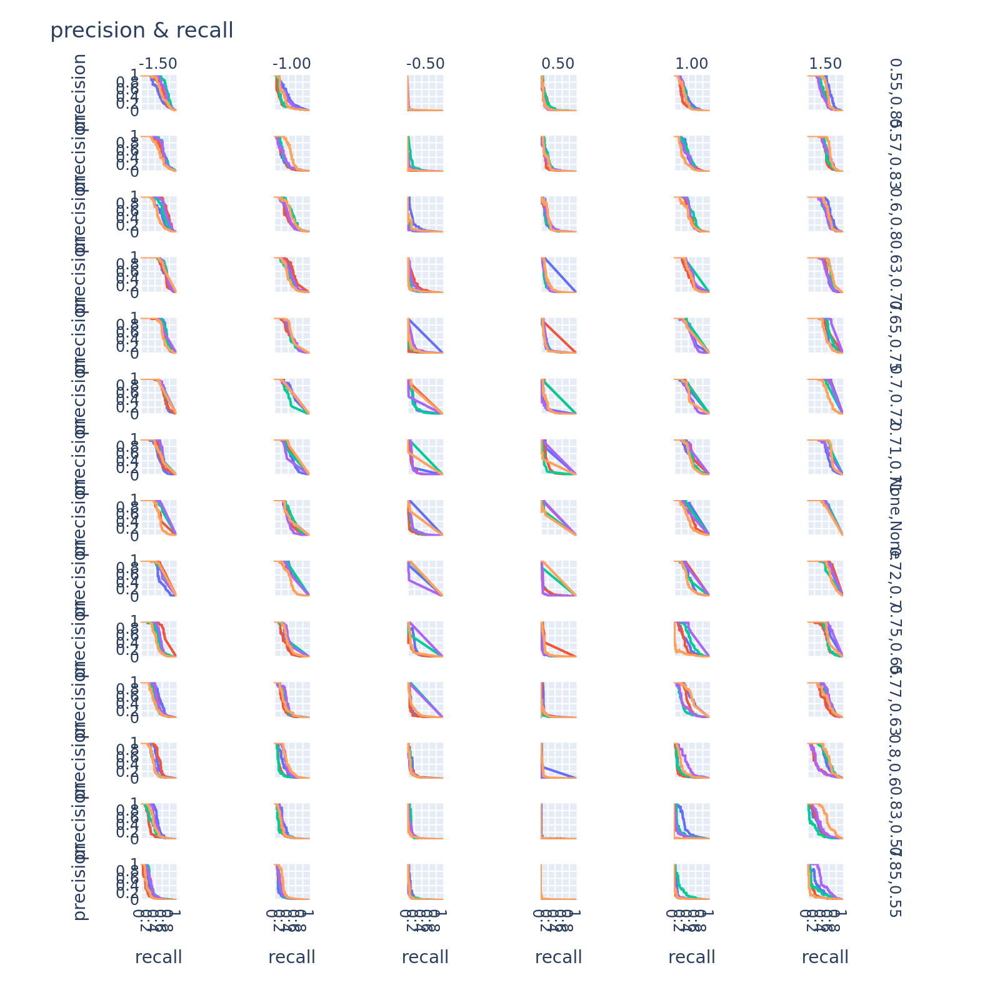

In [19]:
fig = deg_analysis.plot_precision_recall_curve(df_precision_recall_curves)
fig.show(renderer="png", scale=2)

### FPR under no perturbation (don't care)

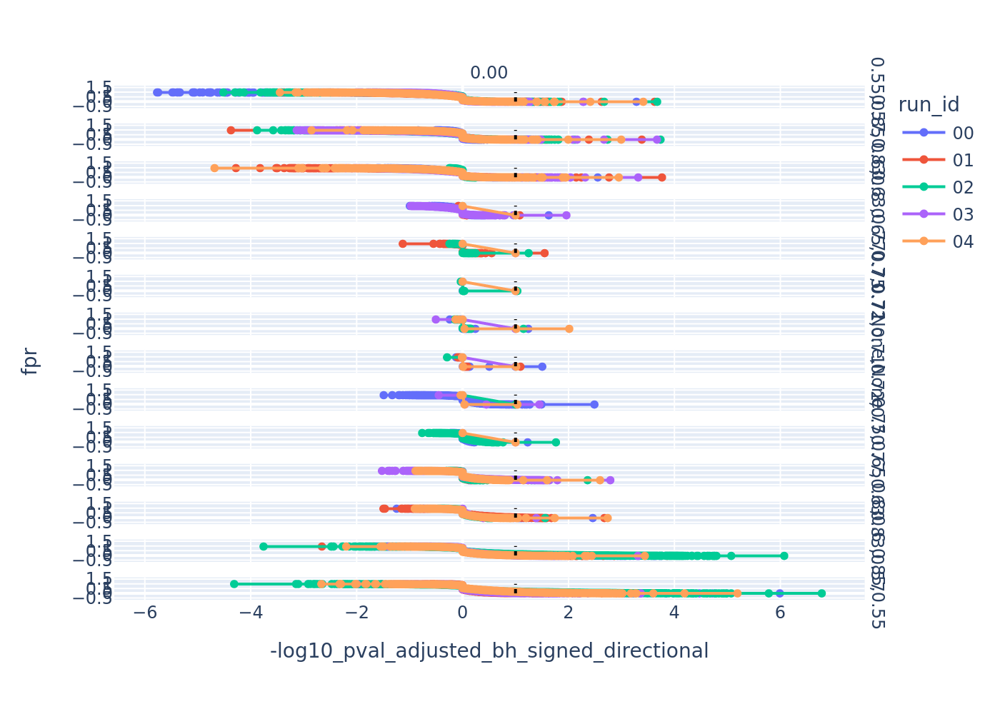

In [20]:
"""
    # .xs(slice("0.65,0.75", None, 3), level="malignant_means", drop_level=False)
"""
subset = df_gene_stats.xs("malignant_cibersortx", level="origin", drop_level=False).xs(
    "0.00", level="log2_fc", drop_level=False
)
df_to_plot, _ = deg_analysis.calculate_roc(subset, score_column)
fig = deg_analysis.plot_metric_by_threshold(df_to_plot, score_column, "fpr")
fig.show(renderer="png", scale=2)

## checking p-values

In [21]:
columns = [
    "pval",
    # "-log10_pval",
    # "-log10_pval_signed_directional",
    # "pval_adjusted_bh",
    # "-log10_pval_adjusted_bh",
    # "-log10_pval_adjusted_bh_signed_directional",
]

# subset_gene_stats = df_gene_stats.loc["malignant_cibersortx", "0.72,0.7", "1.00"]
subset_gene_stats = pd.read_parquet(
    # path_root / "gene_stats" / "malignant_cibersortx" / "0.72,0.7" / "1.00" / "gene_stats.parquet"
    path_root
    / "experiment_id=264/malignant_means=0.72,0.7/log2_fc=1.00/run_id=04/deg_analysis/gene_stats_malignant_cibersortx.parquet"
)

print(subset_gene_stats.shape)

# subset_gene_stats[columns].sort_values(by="-log10_pval_adjusted_bh", ascending=False)
print(subset_gene_stats["significant_bh_fdr=0.10"].value_counts())

# plotly line plots of pvals
import plotly.express as px

df_to_plot = subset_gene_stats.sort_values("pval").reset_index()
df_to_plot["perturbed"] = df_to_plot["perturbed"].astype(int)
df_to_plot["size"] = df_to_plot["perturbed"].apply(lambda x: 10 if x == 1 else 5)

fig = px.scatter(
    df_to_plot,
    x="gene_symbol",
    y=columns,
    # use "o" marker if "perturbed" column is True
    color="perturbed",
    size="perturbed",
)
fig

(16063, 10)
False    16036
True        27
Name: significant_bh_fdr=0.10, dtype: int64
